In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [2]:
rearth=6371000 #m
amax=2000000
rmax=amax+rearth 
amin=600000
rmin=amin+rearth
aavg=800000
ravg=aavg+rearth
G=6.67408*10**-11
mearth=5.972*10**24

In [3]:
def orbv(r):
    return np.sqrt(G*mearth/r)
vmin=orbv(rmax)
vmax=orbv(rmin)
vavg=orbv(ravg)
print('vmax=',vmax,',vmin=',vmin,'vavg=',vavg)

vmax= 7561.501840549689 ,vmin= 6900.283474584655 vavg= 7455.310613115202


Text(0, 0.5, 'Orbital Velocity (km/s)')

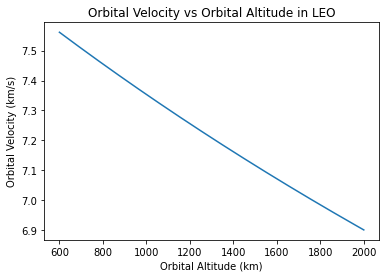

In [4]:
radii=np.linspace(rmin,rmax,10000)
plt.plot(radii/1000-6371,orbv(radii)/1000)
plt.title('Orbital Velocity vs Orbital Altitude in LEO')
plt.xlabel('Orbital Altitude (km)')
plt.ylabel('Orbital Velocity (km/s)')

In [5]:
rho0=1.225
T0=288 #K
R=8.3145
g0=9.81
H0=11100
dv=63.35
cd=0.5
A=10
m=2755
GM=G*mearth
ignenergy=1607424*m

In [16]:
drag=0
t=[0]
v=[]
rho=[]
theta=[0]
r=[]
dt=2
v.append(vavg-dv)
r.append(ravg)
rho.append(rho0*np.exp(-(r[0]-rearth)/H0))
drag=0
i=0
while drag<ignenergy:
    t.append(t[i]+dt)
    v.append(v[i]-0.5*rho[i]*v[i]**2*cd*A*dt/m)
    r.append(r[i]-0.5*(GM/((r[i])**2)-((v[i])**2/r[i]))*(dt)**2)
    rho.append(rho0*np.exp(-(r[i]-rearth)/H0))
    theta.append(theta[i]+np.arctan(v[i]*dt/r[i]))
    drag+=.5*rho[i]*v[i]**3*cd*A*dt
    i+=1
x=r*np.cos(theta)
y=r*np.sin(theta)
thetae=np.linspace(0,2*np.pi,10000)
xe=rearth*np.cos(thetae)
ye=rearth*np.sin(thetae)

In [17]:
fig,ax=plt.subplots()
fig=plt.plot(x,y,'b-',label='Deorbit Trajectory')
fig2=plt.plot(xe,ye,'g-',label='Earth',linewidth=2)
points=plt.plot(x[0],y[0],'ro',markersize=40,label='Starting Point')
impact=plt.plot(x[len(x)-1],y[len(y)-1],'ko',markersize=40,label='Ignition Point')
ax.set_aspect('equal')
plt.rcParams["figure.figsize"] = (180,180)
ax.legend(loc=2,prop={'size':180})

In [18]:
print(t[-1]*dt/86400)

37.02837962962963


In [20]:
r[-1]-rearth

163357.25230147503